In [14]:
# Import Libraries

# Imports to view data
import cv2
import glob
from PIL import Image
import os

# Visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Utils
import numpy as np
import pandas as pd

In [15]:
# folder directions of images
train_dir = "asl_alphabet_train/asl_alphabet_train"

In [16]:
# getting the pathway in each folder into a dataframe using os and glob
all_data = [{'label': os.path.basename(os.path.dirname(f)),
             'path': f} for f in glob.glob(train_dir + '/*/*') if os.path.isfile(f)]

# create pd df with the list
data_df = pd.DataFrame(all_data)
data_df.head()

,label,path
0,A,asl_alphabet_train/asl_alphabet_train\A\A1.jpg
1,A,asl_alphabet_train/asl_alphabet_train\A\A10.jpg
2,A,asl_alphabet_train/asl_alphabet_train\A\A100.jpg
3,A,asl_alphabet_train/asl_alphabet_train\A\A1000.jpg
4,A,asl_alphabet_train/asl_alphabet_train\A\A1001.jpg


In [8]:
#data_df.to_csv('my_dataframe.csv', index=False)

In [4]:
# getting the number of images within each folder using groupby and size
img_num = data_df.groupby(['label']).size()
img_num

label
A          3000
B          3000
C          3000
D          3000
E          3000
F          3000
G          3000
H          3000
I          3000
J          3000
K          3000
L          3000
M          3000
N          3000
O          3000
P          3000
Q          3000
R          3000
S          3000
T          3000
U          3000
V          3000
W          3000
X          3000
Y          3000
Z          3000
del        3000
nothing    3000
space      3000
dtype: int64

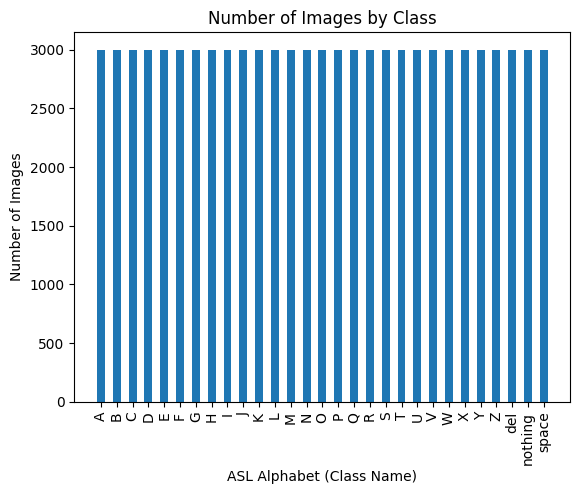

In [31]:
# plot all the number of images by class to identify Class Imbalance
plt.bar(img_num.keys(), img_num, width = .5)

# title and labels of axis
plt.title("Number of Images by Class")
plt.xlabel('ASL Alphabet (Class Name)')
plt.xticks(rotation = 90)
plt.ylabel('Number of Images')

# save the plot as an image file
#plt.savefig('image_num.png')

plt.show()

# All classes have 3000 images so it is balanced.

In [17]:
# check the dimensions of all images to see if they are equal

# creating a function to return the height and width of an image
def get_dims(files):
    '''
    Returns the dimensions for an RGB image
    '''
    # open the file using Image
    im = plt.imread(files)
    # changing the type to a numpy array
    arr = np.array(im)
    # getting the shape of the array
    h, w, d = arr.shape
    # return only the height and width of the image
    return h, w

In [18]:
# using get_dims get all the dimensions of each image
data_df['dimension'] = [get_dims(x) for x in data_df['path']]
data_df.head()

,label,path,dimension
0,A,asl_alphabet_train/asl_alphabet_train\A\A1.jpg,"(200, 200)"
1,A,asl_alphabet_train/asl_alphabet_train\A\A10.jpg,"(200, 200)"
2,A,asl_alphabet_train/asl_alphabet_train\A\A100.jpg,"(200, 200)"
3,A,asl_alphabet_train/asl_alphabet_train\A\A1000.jpg,"(200, 200)"
4,A,asl_alphabet_train/asl_alphabet_train\A\A1001.jpg,"(200, 200)"


In [19]:
# Split the tuple elements of the dimensions into separate columns: height and width
# empty lists for height and width
height = []
width = []

# for every tuple within df['dimenion']
for x in data_df['dimension']:
    # append first value to height
    height.append(x[0])
    # append 2nd value to width
    width.append(x[1])

# add height and width lists into df
data_df['height'] = height
data_df['width'] = width

data_df.head()

,label,path,dimension,height,width
0,A,asl_alphabet_train/asl_alphabet_train\A\A1.jpg,"(200, 200)",200,200
1,A,asl_alphabet_train/asl_alphabet_train\A\A10.jpg,"(200, 200)",200,200
2,A,asl_alphabet_train/asl_alphabet_train\A\A100.jpg,"(200, 200)",200,200
3,A,asl_alphabet_train/asl_alphabet_train\A\A1000.jpg,"(200, 200)",200,200
4,A,asl_alphabet_train/asl_alphabet_train\A\A1001.jpg,"(200, 200)",200,200


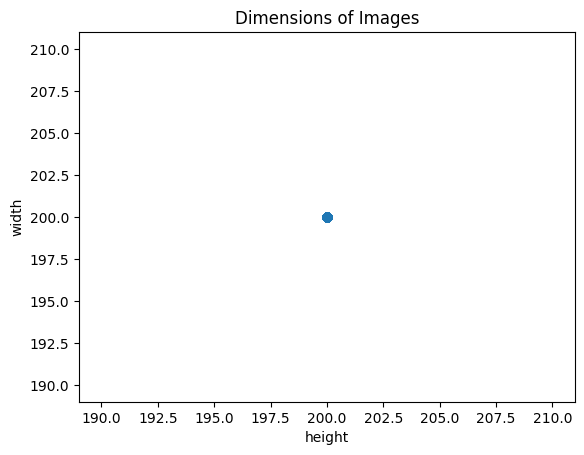

In [32]:
# check dimensions of all images

# scatter plot
plt.scatter(data_df['height'], data_df['width'])

# labels
plt.title('Dimensions of Images')
plt.xlabel('height')
plt.ylabel('width')

# save the plot as an image file
#plt.savefig('image_dims.png')

plt.show()

# all picture are at 200x200 pixels

In [20]:
# read each pathway as images

# empty list for the images
img_list = []

# loop through each pathway in df
for x in data_df['path']:
    # read pathway as image
    img = plt.imread(x)
    # append image into list
    img_list.append(img)

# add list as df column
data_df['image'] = img_list
data_df.head()

,label,path,dimension,height,width,image
0,A,asl_alphabet_train/asl_alphabet_train\A\A1.jpg,"(200, 200)",200,200,"[[[1, 2, 252], [1, 0, 248], [10, 0, 249], [5, ..."
1,A,asl_alphabet_train/asl_alphabet_train\A\A10.jpg,"(200, 200)",200,200,"[[[0, 6, 252], [0, 2, 248], [4, 0, 243], [5, 0..."
2,A,asl_alphabet_train/asl_alphabet_train\A\A100.jpg,"(200, 200)",200,200,"[[[0, 8, 253], [0, 2, 249], [5, 0, 250], [6, 0..."
3,A,asl_alphabet_train/asl_alphabet_train\A\A1000.jpg,"(200, 200)",200,200,"[[[0, 7, 254], [0, 3, 251], [5, 0, 247], [8, 0..."
4,A,asl_alphabet_train/asl_alphabet_train\A\A1001.jpg,"(200, 200)",200,200,"[[[0, 3, 254], [0, 2, 253], [5, 0, 249], [10, ..."


In [21]:
# pixel distrubution of the sample image

# empty list for flatten images
flatten_img = []

# loop through all the images in df
for x in data_df['image']:
    # flatten image for the distribution of pixels
    flatten_img.append(x.flatten())
    
# add flatten images list into df
data_df['flatten'] = flatten_img
data_df.head()

,label,path,dimension,height,width,image,flatten
0,A,asl_alphabet_train/asl_alphabet_train\A\A1.jpg,"(200, 200)",200,200,"[[[1, 2, 252], [1, 0, 248], [10, 0, 249], [5, ...","[1, 2, 252, 1, 0, 248, 10, 0, 249, 5, 0, 245, ..."
1,A,asl_alphabet_train/asl_alphabet_train\A\A10.jpg,"(200, 200)",200,200,"[[[0, 6, 252], [0, 2, 248], [4, 0, 243], [5, 0...","[0, 6, 252, 0, 2, 248, 4, 0, 243, 5, 0, 242, 0..."
2,A,asl_alphabet_train/asl_alphabet_train\A\A100.jpg,"(200, 200)",200,200,"[[[0, 8, 253], [0, 2, 249], [5, 0, 250], [6, 0...","[0, 8, 253, 0, 2, 249, 5, 0, 250, 6, 0, 246, 2..."
3,A,asl_alphabet_train/asl_alphabet_train\A\A1000.jpg,"(200, 200)",200,200,"[[[0, 7, 254], [0, 3, 251], [5, 0, 247], [8, 0...","[0, 7, 254, 0, 3, 251, 5, 0, 247, 8, 0, 243, 6..."
4,A,asl_alphabet_train/asl_alphabet_train\A\A1001.jpg,"(200, 200)",200,200,"[[[0, 3, 254], [0, 2, 253], [5, 0, 249], [10, ...","[0, 3, 254, 0, 2, 253, 5, 0, 249, 10, 0, 248, ..."


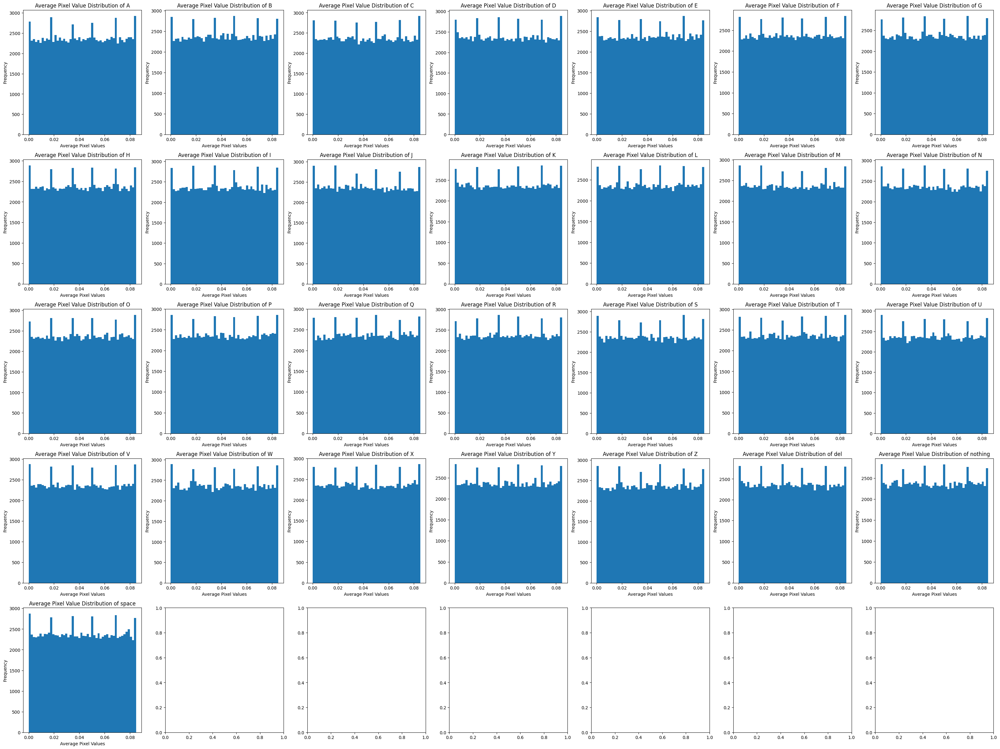

In [37]:
# distribution of pixel values of the mean of each folder

# get the mean of the flattened image grouped by label
flatten_mean = data_df.groupby(by = 'label')['flatten'].mean()

# plot the graph, using subplot
fig, axs = plt.subplots(5, 7, figsize = (40,30))

# flatten the axs to loop through
axs = axs.flatten()

# loop through the means and axs
for (label, x), ax in zip(flatten_mean.items(), axs):
    # plot histogram of the pixel values
    ax.hist(x, bins = 50)
    # set title for the graphs
    ax.set_title(f'Average Pixel Value Distribution of {label}')
    ax.set_xlabel('Average Pixel Values')
    ax.set_ylabel('Frequency')

# save the plot as an image file
#plt.savefig('image_pixel_distribution.png')

plt.show()

# the mean of the pixel values are similar between each alphabet 

In [28]:
# define function to randomly select one row for each group
def random_sample(group, random_seed = None):
    ''' 
    returns 1 random sample within the group, also able to input a random_seed for reproducibility
    '''
    if random_seed is not None:
        np.random.seed(random_seed)
    return group.sample(1)

# Apply function to each group and concatenate results into a new dataframe
sample_df = pd.concat([random_sample(group, random_seed = 42) for name, group in data_df.groupby('label')], ignore_index = True)
sample_df = sample_df.drop(columns = ['dimension', 'height', 'width'])
sample_df.head()

,label,path,image,flatten
0,A,asl_alphabet_train/asl_alphabet_train\A\A262.jpg,"[[[0, 4, 252], [0, 2, 248], [8, 0, 244], [7, 0...","[0, 4, 252, 0, 2, 248, 8, 0, 244, 7, 0, 239, 7..."
1,B,asl_alphabet_train/asl_alphabet_train\B\B262.jpg,"[[[0, 7, 254], [0, 7, 253], [4, 0, 240], [11, ...","[0, 7, 254, 0, 7, 253, 4, 0, 240, 11, 0, 242, ..."
2,C,asl_alphabet_train/asl_alphabet_train\C\C262.jpg,"[[[0, 7, 253], [0, 5, 252], [4, 0, 248], [9, 0...","[0, 7, 253, 0, 5, 252, 4, 0, 248, 9, 0, 246, 3..."
3,D,asl_alphabet_train/asl_alphabet_train\D\D262.jpg,"[[[0, 9, 250], [0, 5, 247], [6, 0, 242], [8, 0...","[0, 9, 250, 0, 5, 247, 6, 0, 242, 8, 0, 242, 6..."
4,E,asl_alphabet_train/asl_alphabet_train\E\E262.jpg,"[[[0, 8, 249], [0, 7, 249], [0, 0, 241], [8, 0...","[0, 8, 249, 0, 7, 249, 0, 0, 241, 8, 0, 246, 5..."


In [29]:
# empty list for the images
cv2_list = []

# loop through each pathway in df
for x in sample_df['path']:
    # read pathway as image
    img = cv2.imread(x)
    # append image into list
    cv2_list.append(img)

# add list as df column
sample_df['image - BGR'] = cv2_list
sample_df.head()

,label,path,image,flatten,image - BGR
0,A,asl_alphabet_train/asl_alphabet_train\A\A262.jpg,"[[[0, 4, 252], [0, 2, 248], [8, 0, 244], [7, 0...","[0, 4, 252, 0, 2, 248, 8, 0, 244, 7, 0, 239, 7...","[[[252, 4, 0], [248, 2, 0], [244, 0, 8], [239,..."
1,B,asl_alphabet_train/asl_alphabet_train\B\B262.jpg,"[[[0, 7, 254], [0, 7, 253], [4, 0, 240], [11, ...","[0, 7, 254, 0, 7, 253, 4, 0, 240, 11, 0, 242, ...","[[[254, 7, 0], [253, 7, 0], [240, 0, 4], [242,..."
2,C,asl_alphabet_train/asl_alphabet_train\C\C262.jpg,"[[[0, 7, 253], [0, 5, 252], [4, 0, 248], [9, 0...","[0, 7, 253, 0, 5, 252, 4, 0, 248, 9, 0, 246, 3...","[[[253, 7, 0], [252, 5, 0], [248, 0, 4], [246,..."
3,D,asl_alphabet_train/asl_alphabet_train\D\D262.jpg,"[[[0, 9, 250], [0, 5, 247], [6, 0, 242], [8, 0...","[0, 9, 250, 0, 5, 247, 6, 0, 242, 8, 0, 242, 6...","[[[250, 9, 0], [247, 5, 0], [242, 0, 6], [242,..."
4,E,asl_alphabet_train/asl_alphabet_train\E\E262.jpg,"[[[0, 8, 249], [0, 7, 249], [0, 0, 241], [8, 0...","[0, 8, 249, 0, 7, 249, 0, 0, 241, 8, 0, 246, 5...","[[[249, 8, 0], [249, 7, 0], [241, 0, 0], [246,..."


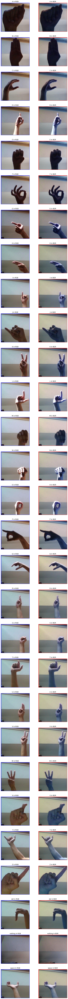

In [30]:
# create the subplots for each label
fig, axs = plt.subplots(len(sample_df), 2, figsize=(10, 5*len(sample_df['label'])))

# loop through each label
for i, label in enumerate(sample_df['label']):
    # get the RGB and BGR images for each label
    df_label = sample_df[sample_df['label'] == label]
    img_rgb = df_label['image'].values[0]
    img_bgr = df_label['image - BGR'].values[0]

    # plot the RGB image on the left subplot
    axs[i, 0].imshow(img_rgb)
    axs[i, 0].axis('Off')
    axs[i, 0].set_title(f'{label} in RGB')

    # plot the BGR image on the right subplot
    axs[i, 1].imshow(img_bgr)
    axs[i, 1].axis('Off')
    axs[i, 1].set_title(f'{label} in BGR')

# save the plot as an image file
#plt.savefig('image_colour.png')

# show the figure
plt.show()

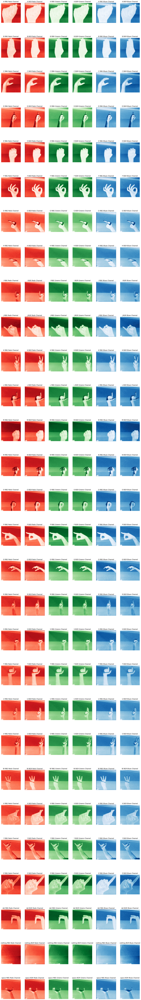

In [31]:
# create the subplots for each label
fig, axs = plt.subplots(len(sample_df), 6, figsize=(20, 5*len(sample_df['label'])))

# loop through each label
for i, row in sample_df.iterrows():
    label = row['label']
    img_rgb = row['image']
    img_bgr = row['image - BGR']
    
    # plot the RGB channels
    for j, color in enumerate(['Reds', 'Greens', 'Blues']):
        if color == 'Reds':
            axs[i, 0].imshow(img_rgb[:,:,j], cmap=color)
            axs[i, 0].axis('Off')
            axs[i, 0].set_title(f'{label} RBG {color} Channel')
            axs[i, 1].imshow(img_bgr[:,:,j], cmap=color)
            axs[i, 1].axis('Off')
            axs[i, 1].set_title(f'{label} BGR {color} Channel')
        elif color == 'Greens':
            axs[i, 2].imshow(img_rgb[:,:,j], cmap=color)
            axs[i, 2].axis('Off')
            axs[i, 2].set_title(f'{label} RBG {color} Channel')
            axs[i, 3].imshow(img_bgr[:,:,j], cmap=color)
            axs[i, 3].axis('Off')
            axs[i, 3].set_title(f'{label} BGR {color} Channel')
        else:
            axs[i, 4].imshow(img_rgb[:,:,j], cmap=color)
            axs[i, 4].axis('Off')
            axs[i, 4].set_title(f'{label} RBG {color} Channel')
            axs[i, 5].imshow(img_bgr[:,:,j], cmap=color)
            axs[i, 5].axis('Off')
            axs[i, 5].set_title(f'{label} BGR {color} Channel')

# save the plot as an image file
#plt.savefig('image_channels.png')

# show the figure
plt.show()

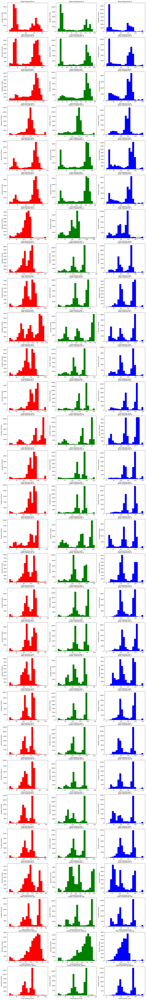

In [34]:
# create the subplots for each label
fig, axs = plt.subplots(len(sample_df), 3, figsize=(20, 5*len(sample_df['label'])))

# loop through each label
for i, row in sample_df.iterrows():
    label = row['label']
    img_rgb = row['image']
    
    # plot the RGB channels
    for j, color in enumerate(['Red', 'Green', 'Blue']):
        if color == 'Red':
            axs[i, 0].hist(img_rgb[:,:,j].ravel(), bins=20, color = 'Red')
            axs[i, 0].set_title(f'{color} Channel for {label}')
            axs[i, 0].set_xlabel('Pixel Intensity Level')
            axs[i, 0].set_ylabel('Number of Pixels')
        elif color == 'Green':
            axs[i, 1].hist(img_rgb[:,:,j].ravel(), bins=20, color = 'Green')
            axs[i, 1].set_title(f'{color} Channel for {label}')
            axs[i, 1].set_xlabel('Pixel Intensity Level')
            axs[i, 1].set_ylabel('Number of Pixels')
        else:
            axs[i, 2].hist(img_rgb[:,:,j].ravel(), bins=20, color = 'Blue')
            axs[i, 2].set_title(f'{color} Channel for {label}')
            axs[i, 2].set_xlabel('Pixel Intensity Level')
            axs[i, 2].set_ylabel('Number of Pixels')

# save the plot as an image file
plt.savefig('image_chls_hist.png')

# show the figure
plt.show()

Matplotlib VS cv2
- cv2 reads in channels as BGR
- matplotlib reads in channels as RGB

Can change from BGR to RGB using :
- img_cv2_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)

plt.imread = are more warm in colour tone, uses more red

cv2.imread = are more cool in colour tone, uses more blue

For both the amount of green used seem to be similar

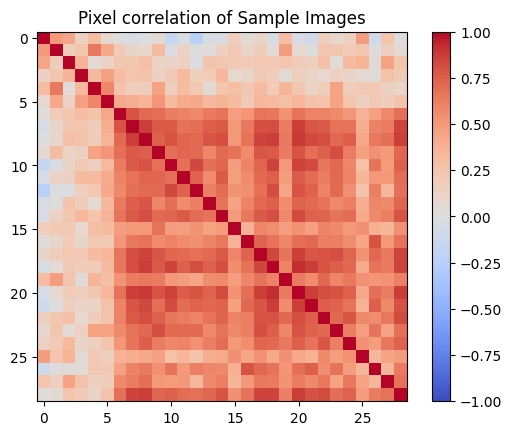

In [40]:
# Load the pixel values for each image into a 2D NumPy array
pixel_values = np.array(sample_df['flatten'].tolist())

# Compute the correlation matrix between the pixel value distributions
corr_matrix = np.corrcoef(pixel_values)

# Plot the correlation matrix as a heatmap
plt.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
plt.colorbar()

# set title
plt.title('Pixel correlation of Sample Images')

# save the plot as an image file
#plt.savefig('pixel_corr.png')

plt.show()